# 3
In this section, I extracted the datas from the dataset, gave numbers to the non-numeric features and plotted the features 2 by 2 using red and blue for final labels. Then afterwards I chose a few of the best feature couples so that I can classify the dataset in the next part (4).

### 3-1
in this sub-part, I extracted the the dataset with all the features, processed the non-numeric numbers as demonstrated in the code below and plotted 120 plots each showing a couple of the features and labelled them with either red or blue. Here I reviewed every plot and chose 4 couple of features that seperate the dataset in the best ways. 

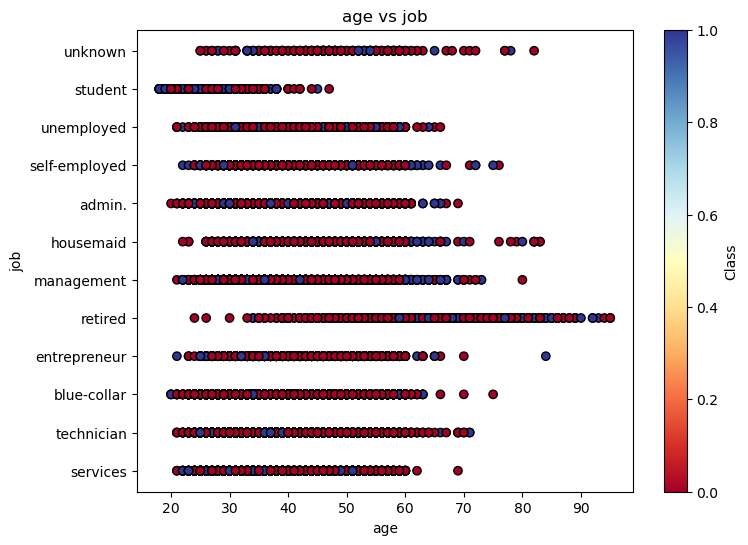

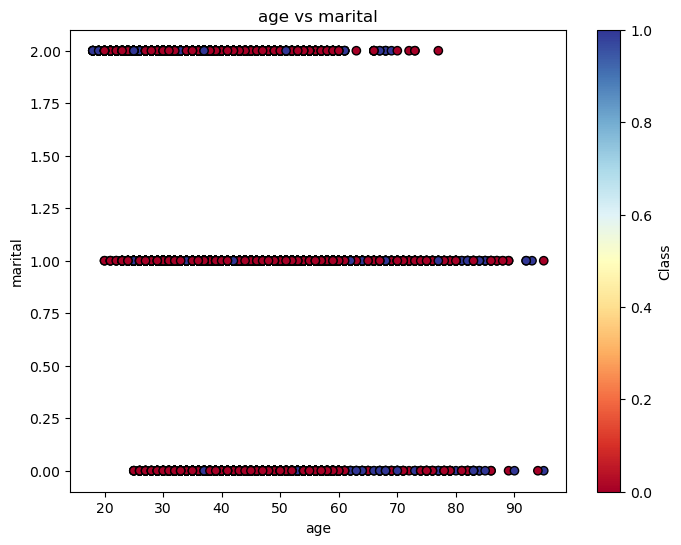

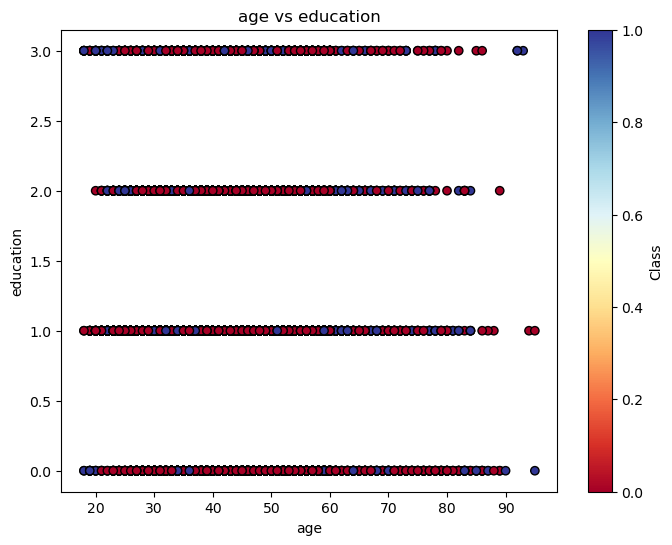

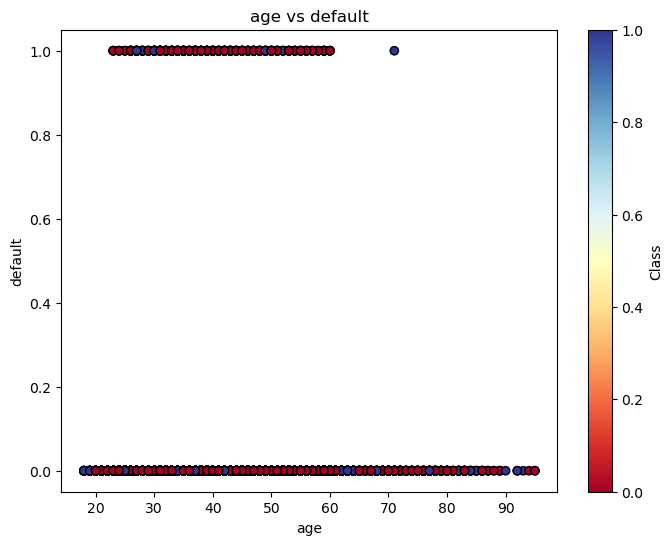

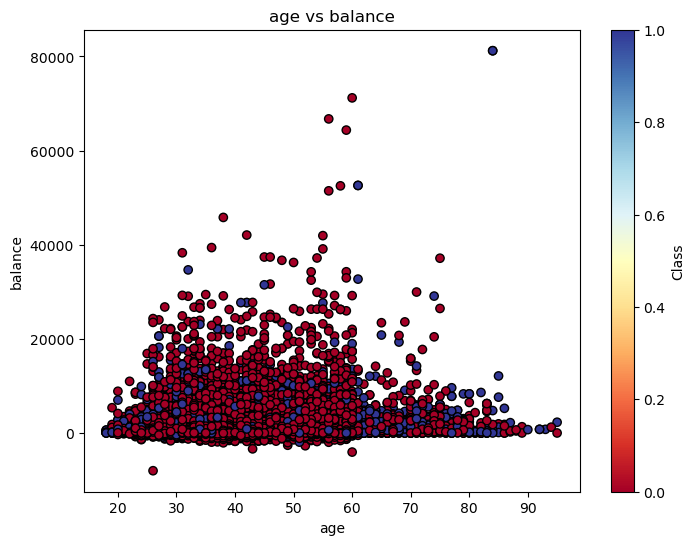

...

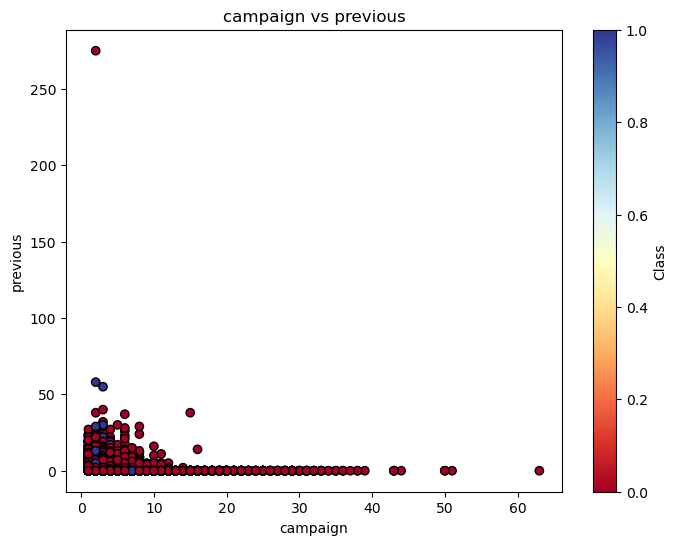

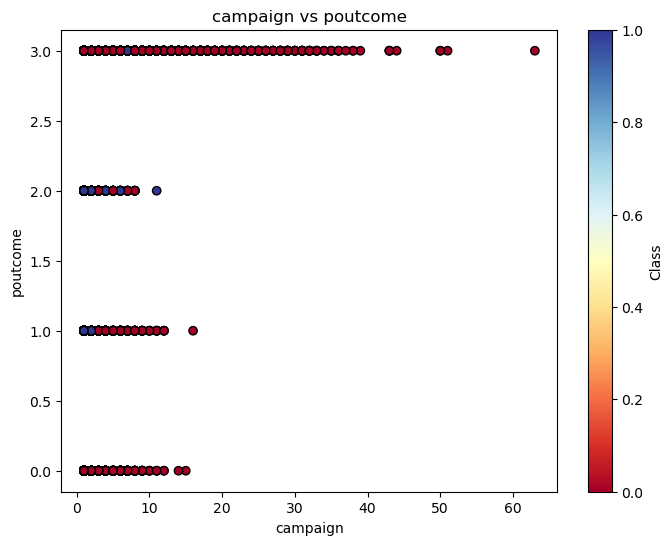

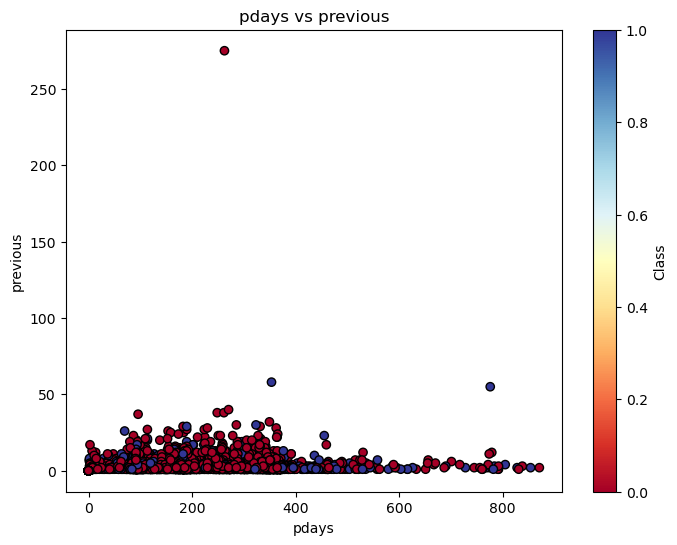

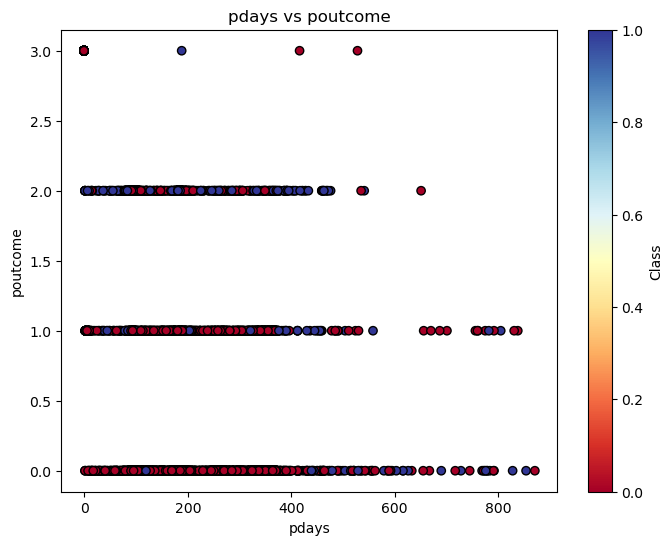

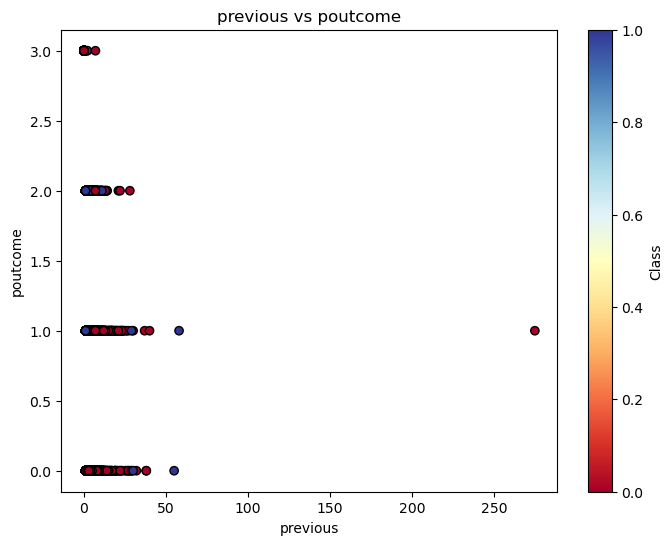

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

#Reading the dataset
dataset = pd.read_csv("dataset.csv")
#Processing non-numeric features
dataset['marital'] = dataset['marital'].astype('category').cat.codes
dataset['default'] = dataset['default'].map({'yes': 1, 'no': 0})
dataset['housing'] = dataset['housing'].map({'yes': 1, 'no': 0})
dataset['loan'] = dataset['loan'].map({'yes': 1, 'no': 0})
dataset['month'] = dataset['month'].astype('category').cat.codes
dataset['education'] = dataset['education'].astype('category').cat.codes
dataset['contact'] = dataset['contact'].astype('category').cat.codes
dataset['poutcome'] = dataset['poutcome'].astype('category').cat.codes
dataset['y'] = dataset['y'].map({'yes': 1, 'no': 0})

#Ploting every couple of features
features = ['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan',
            'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome']

for i in range(len(features) - 1):
    for j in range(i + 1, len(features)):
        plt.figure(figsize=(8, 6))
        plt.scatter(dataset[features[i]], dataset[features[j]], c=dataset['y'], cmap=plt.cm.RdYlBu, edgecolor='k')
        plt.xlabel(features[i])
        plt.ylabel(features[j])
        plt.title(f'{features[i]} vs {features[j]}')
        plt.colorbar(label='Class')
        plt.show()

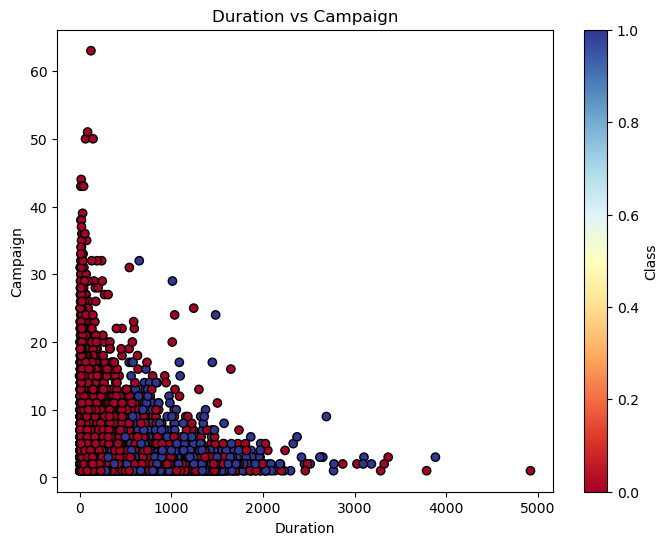

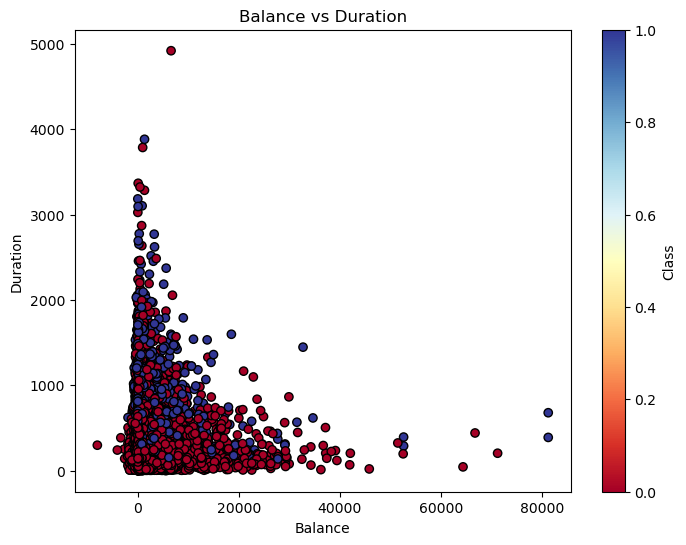

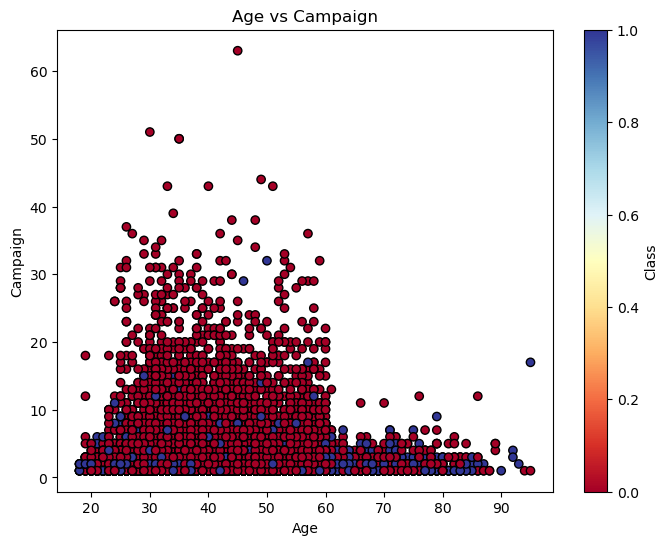

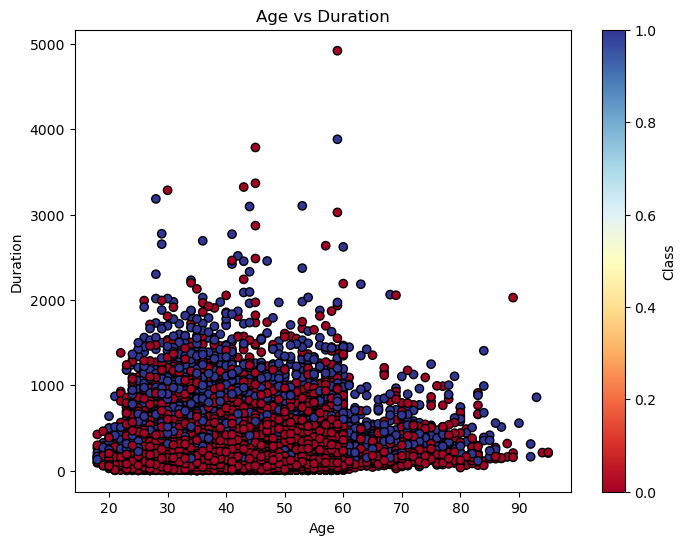

In [8]:
#duration vs campaign
plt.figure(figsize=(8, 6))
plt.scatter(dataset['duration'], dataset['campaign'], c=dataset['y'], cmap=plt.cm.RdYlBu, edgecolor='k')
plt.xlabel('Duration')
plt.ylabel('Campaign')
plt.title('Duration vs Campaign')
plt.colorbar(label='Class')
plt.show()
#balance vs duration
plt.figure(figsize=(8, 6))
plt.scatter(dataset['balance'], dataset['duration'], c=dataset['y'], cmap=plt.cm.RdYlBu, edgecolor='k')
plt.xlabel('Balance')
plt.ylabel('Duration')
plt.title('Balance vs Duration')
plt.colorbar(label='Class')
plt.show()
#age vs campaign
plt.figure(figsize=(8, 6))
plt.scatter(dataset['age'], dataset['campaign'], c=dataset['y'], cmap=plt.cm.RdYlBu, edgecolor='k')
plt.xlabel('Age')
plt.ylabel('Campaign')
plt.title('Age vs Campaign')
plt.colorbar(label='Class')
plt.show()
#age vs duration
plt.figure(figsize=(8, 6))
plt.scatter(dataset['age'], dataset['duration'], c=dataset['y'], cmap=plt.cm.RdYlBu, edgecolor='k')
plt.xlabel('Age')
plt.ylabel('Duration')
plt.title('Age vs Duration')
plt.colorbar(label='Class')
plt.show()

### 3-2
In this sub-part I plotted the histogram for each feature and randomly chose 5 couples of features and plotted them.

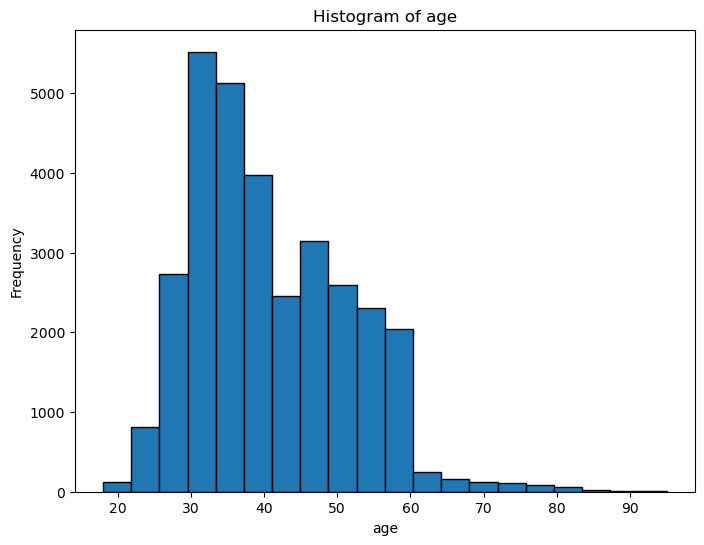

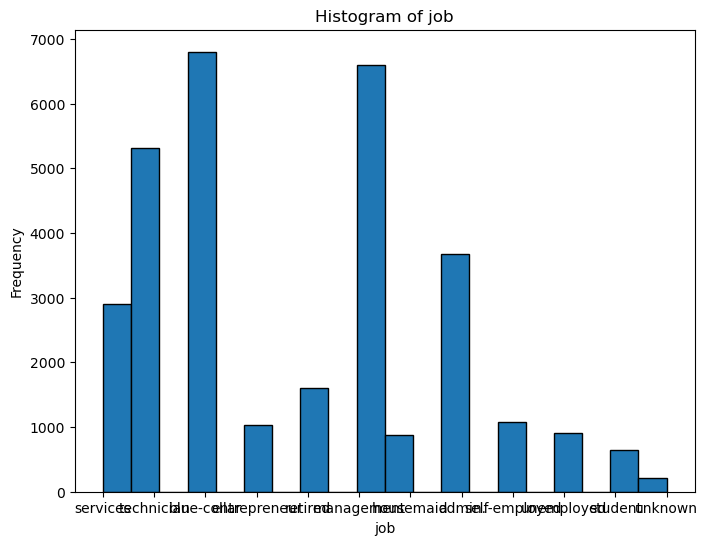

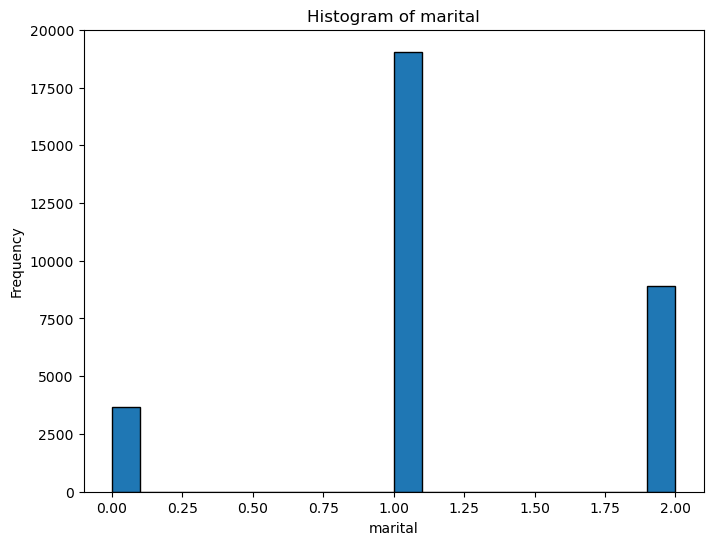

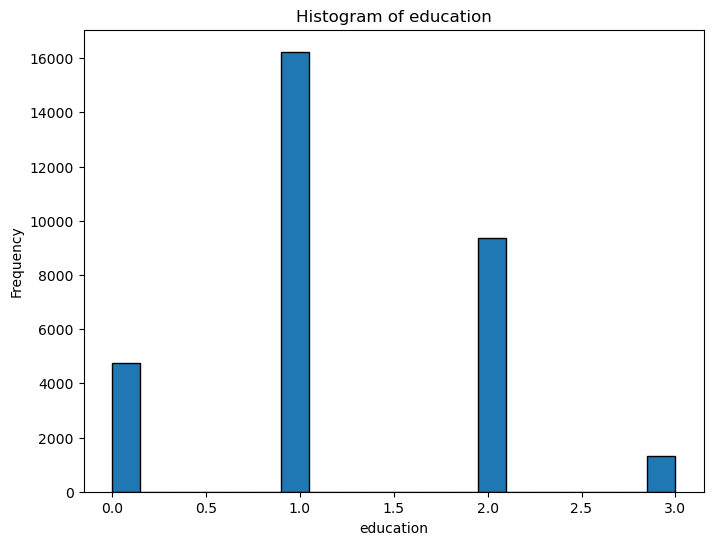

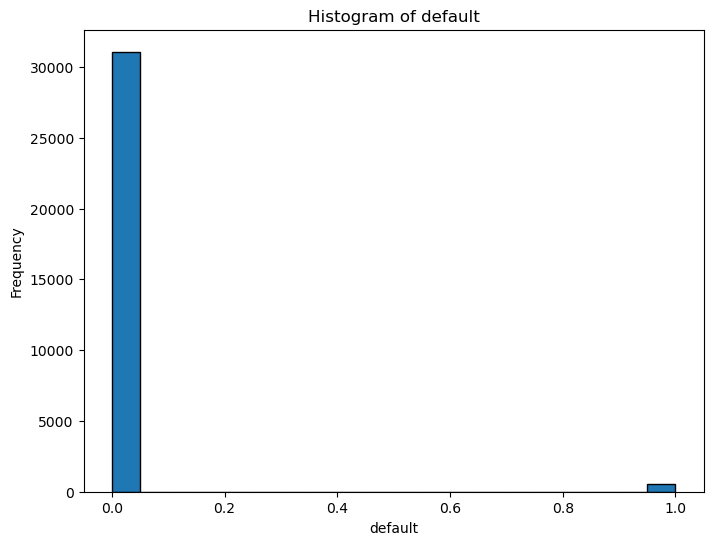

...

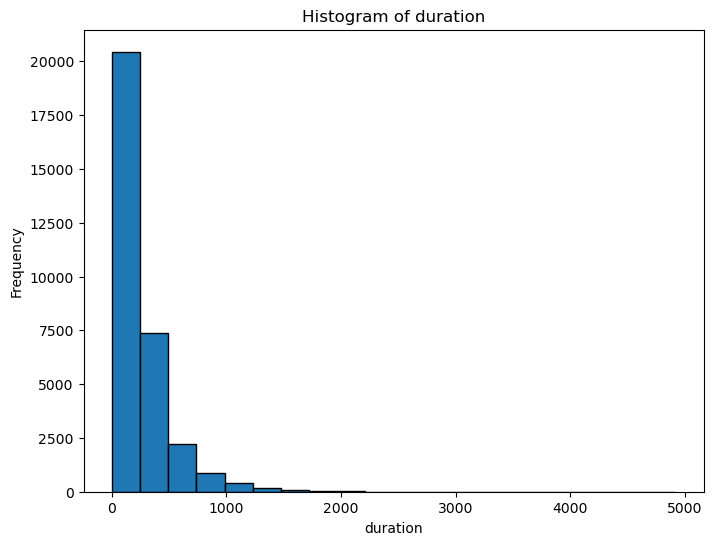

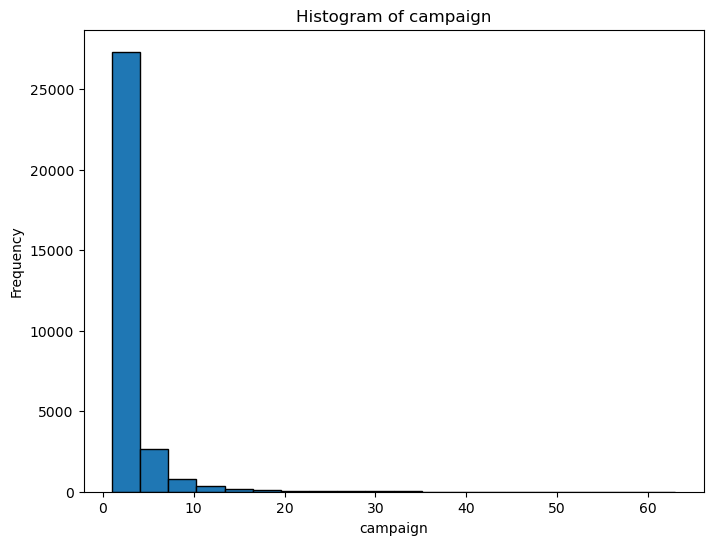

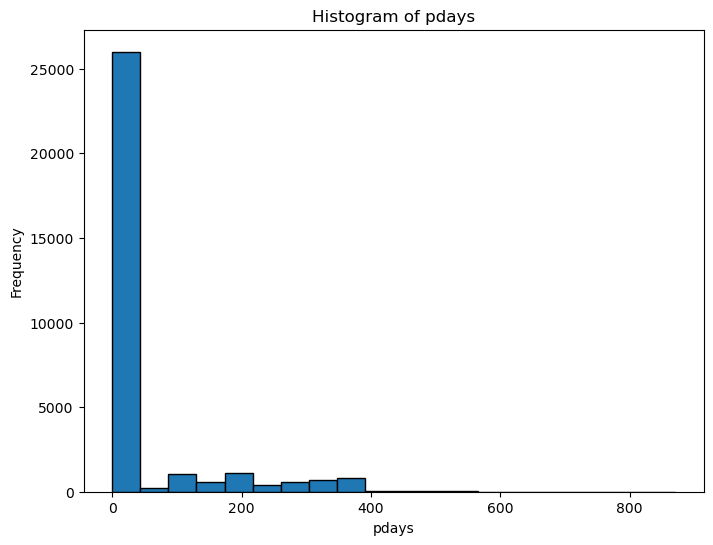

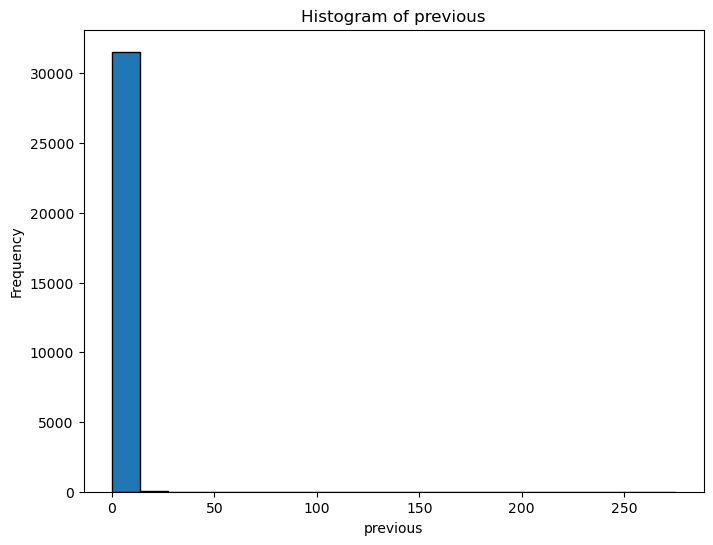

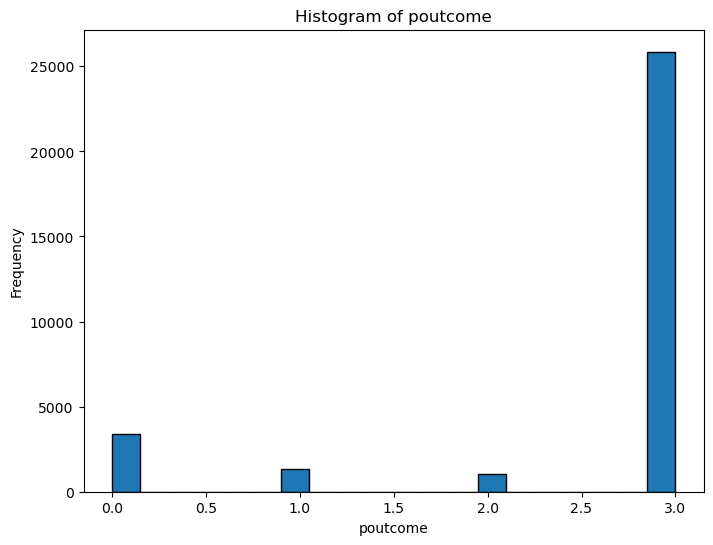

In [11]:
import matplotlib.pyplot as plt

# Plot histograms for each feature
features = ['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan',
            'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome']

for feature in features:
    plt.figure(figsize=(8, 6))
    plt.hist(dataset[feature], bins=20, edgecolor='k')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {feature}')
    plt.show()

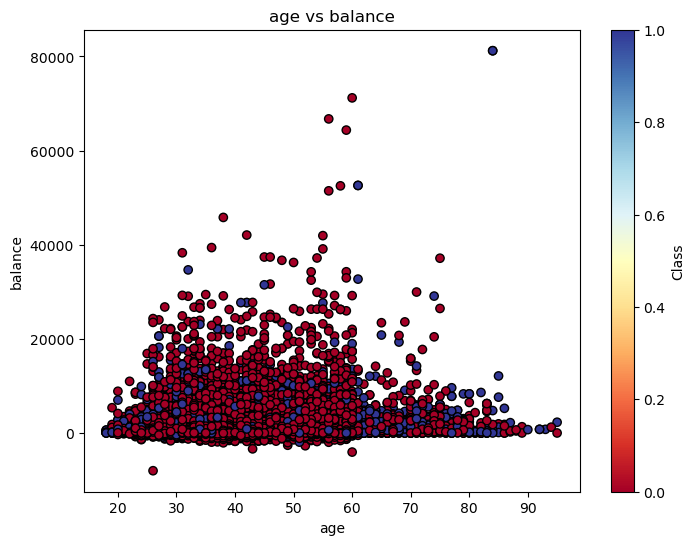

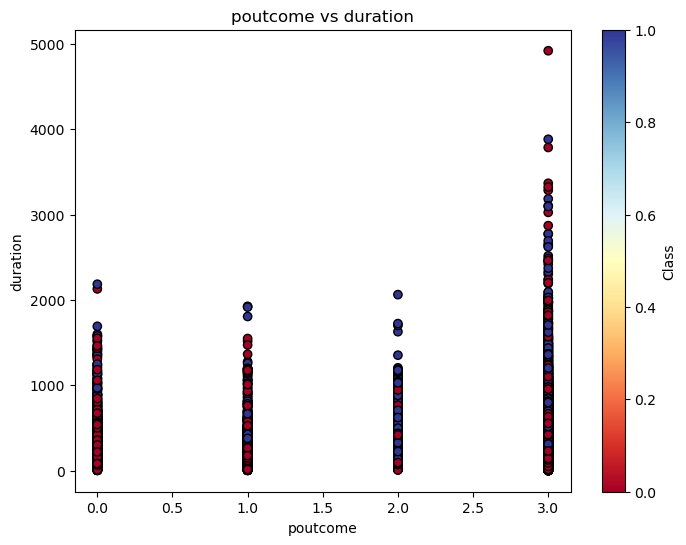

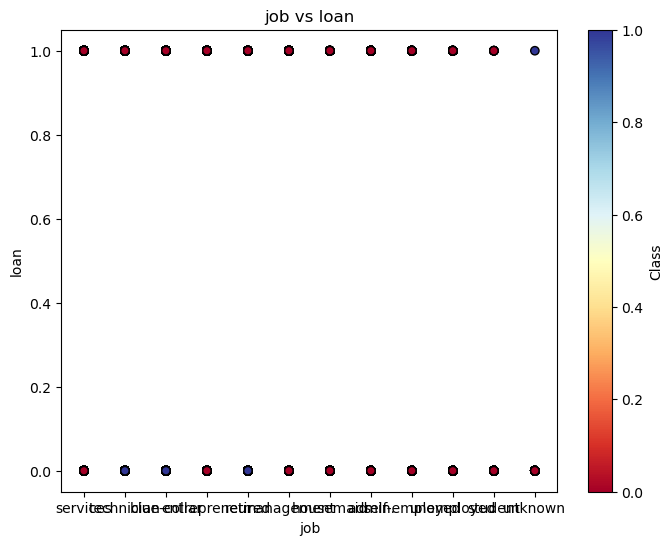

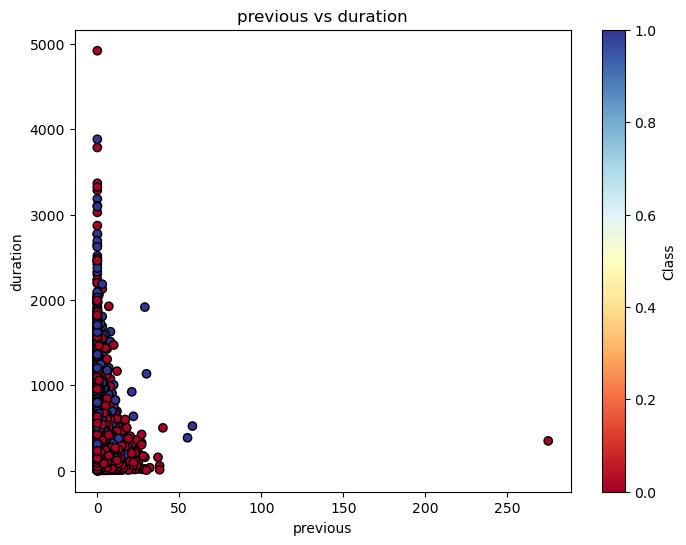

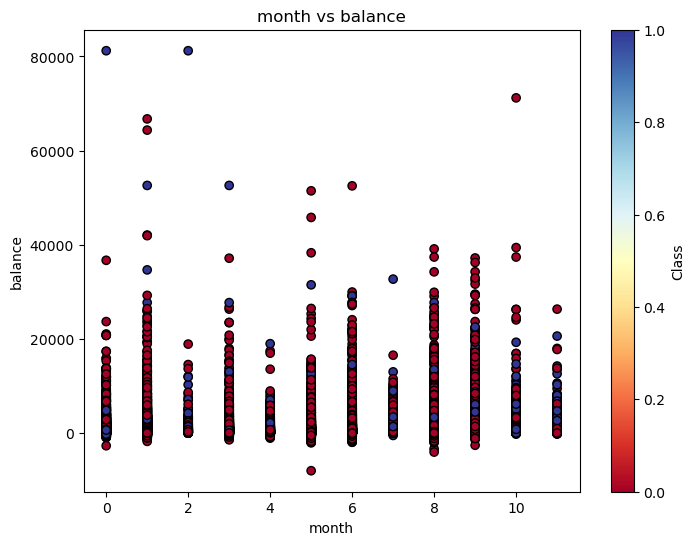

In [12]:
import matplotlib.pyplot as plt
import numpy as np
#Randomly select two features and plot them 5 times
for _ in range(5):
    selected_features = np.random.choice(features, size=2, replace=False)
    plt.figure(figsize=(8, 6))
    plt.scatter(dataset[selected_features[0]], dataset[selected_features[1]], c=dataset['y'], cmap=plt.cm.RdYlBu, edgecolor='k')
    plt.xlabel(selected_features[0])
    plt.ylabel(selected_features[1])
    plt.title(f'{selected_features[0]} vs {selected_features[1]}')
    plt.colorbar(label='Class')
    plt.show()

### Note that I have already chosen 4 couples of features in the previous section which devide the classes in the best way visually.

# 4 Training the model
selecting 30% of the dataset as the test_set and the remaining 70% as the training_set.

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
dataset = pd.read_csv("dataset.csv")
#Defining features and target variable
X = dataset.drop(columns=['y'])
y = dataset['y']
#Spliting the dataset into 70% training_set and 30% test_set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
#Later on in the program I will use StratifiedKFold which preserves the 70-30 percentage.

### 4-1 & 4-2 RBF
In this subsection I will use the rbf classifier using all the features. I could have only used 5 of the best features while almost maintaining the same results. based on section 3-1 , the best features were: age, campaign,
duration and balance. however, using all the features still gave me a better result.

In [52]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report, f1_score, recall_score, precision_score, accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
import numpy as np

#Defining the features and target variable y
#note that I have already done this part in the previous section (3-1) but I was recommended a different approach 
#to adding values to non-numeric (categorial) features.
X = dataset[['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome']]
y = dataset['y']
#label encoding for categorical features
label_encoder = LabelEncoder()
X_encoded = X.copy()
for col in ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']:
    X_encoded[col] = label_encoder.fit_transform(X[col])

#convert target y variable to binary values of 0 or 1
y_binary = y.replace({'yes': 0, 'no': 1})
#Initializing lists to store evaluation metrics
f1_scores = []
recall_scores = []
precision_scores = []
accuracy_scores = []
conf_matrices = []
#Performing 5-fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True)
for train_index, test_index in skf.split(X_encoded, y_binary):
    X_train, X_test = X_encoded.iloc[train_index], X_encoded.iloc[test_index]
    y_train, y_test = y_binary.iloc[train_index], y_binary.iloc[test_index]
    
    #RBF classifier
    clf = SVC(kernel='rbf')    
    #Train the RBF classifier
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    #Calculating the evaluation metrics for each fold
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    print(f"\nConfusion matrix:")
    print(conf_matrix)    
    f1_scores.append(f1)
    recall_scores.append(recall)
    precision_scores.append(precision)
    accuracy_scores.append(accuracy)
    conf_matrices.append(conf_matrix)



#Calculating and printing the mean and variance of evaluation metrics as stated in the problem
mean_f1 = np.mean(f1_scores)
mean_recall = np.mean(recall_scores)
mean_precision = np.mean(precision_scores)
mean_accuracy = np.mean(accuracy_scores)
var_f1 = np.var(f1_scores)
var_recall = np.var(recall_scores)
var_precision = np.var(precision_scores)
var_accuracy = np.var(accuracy_scores)
print("Mean F1-Score:", mean_f1)
print("Mean Recall:", mean_recall)
print("Mean Precision:", mean_precision)
print("Mean Accuracy:", mean_accuracy)
print("\nVariance F1-Score:", var_f1)
print("Variance Recall:", var_recall)
print("Variance Precision:", var_precision)
print("Variance Accuracy:", var_accuracy)


Confusion matrix:
[[   8  730]
 [   6 5586]]

Confusion matrix:
[[   7  731]
 [   2 5590]]

Confusion matrix:
[[  10  727]
 [   6 5586]]

Confusion matrix:
[[   7  730]
 [   5 5587]]

Confusion matrix:
[[   5  733]
 [   7 5584]]
Mean F1-Score: 0.9382462991741825
Mean Recall: 0.999070055364372
Mean Precision: 0.884403557662564
Mean Accuracy: 0.8838120420132807

Variance F1-Score: 4.790564949768476e-08
Variance Recall: 9.468684889237682e-08
Variance Precision: 7.769804603400548e-08
Variance Accuracy: 1.6792619310994461e-07


### 4-1 & 4-2 Decision Tree
In this section I used the decision tree as the main classifier, and performed 5-fold cross-validation.
For each of the 5 times performing the decision tree, I reported the resulting F1-score, recall , precision,
accuracy and the confusion matrix. In the end I calculated the mean and variance for all the reported results.
Note that the final results in this calssifier weren't that good.
I also excluded some of the features that didnt make a difference in the results for a lighter code using 
X_encoded.drop function.

In [71]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, f1_score, recall_score, precision_score, accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
import numpy as np

#Defining the features and target variable y
#note that I have already done this part in the previous section (3-1) but I was recommended a different approach 
#to adding values to non-numeric (categorial) features.
X = dataset[['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome']]
y = dataset['y']
#label encoding for categorical features
label_encoder = LabelEncoder()
X_encoded = X.copy()
for col in ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']:
    X_encoded[col] = label_encoder.fit_transform(X[col])

#.drop function used here as stated above:
#X_encoded = X_encoded.drop(columns=[ 'marital', 'default', 'pdays'])
#Converting target variable y to binary values 0 or 1:
y_binary = y.replace({'yes': 0, 'no': 1})
#Initializing lists to store evaluation metrics for final report
f1_scores = []
recall_scores = []
precision_scores = []
accuracy_scores = []
#Performing 5-fold cross-validation:
#Here StratifiedKfold ensures me that the 70% and 30% percentages are preserved.
skf = StratifiedKFold(n_splits=5, shuffle=True)
for train_index, test_index in skf.split(X_encoded, y_binary):
    X_train, X_test = X_encoded.iloc[train_index], X_encoded.iloc[test_index]
    y_train, y_test = y_binary.iloc[train_index], y_binary.iloc[test_index]
    clf_DT = DecisionTreeClassifier()
    clf_DT.fit(X_train, y_train)
    #Predictions on the test set
    y_pred = clf_DT.predict(X_test)
    #Calculating the evaluation metrics for each fold
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    f1_scores.append(f1)
    recall_scores.append(recall)
    precision_scores.append(precision)
    accuracy_scores.append(accuracy)
    print(f"\nConfusion matrix:")
    print(conf_matrix)

#Calculating and printing the mean and variance of evaluation metrics as stated in the problem
mean_f1 = np.mean(f1_scores)
mean_recall = np.mean(recall_scores)
mean_precision = np.mean(precision_scores)
mean_accuracy = np.mean(accuracy_scores)
var_f1 = np.var(f1_scores)
var_recall = np.var(recall_scores)
var_precision = np.var(precision_scores)
var_accuracy = np.var(accuracy_scores)
print("Mean F1-Score:", mean_f1)
print("Mean Recall:", mean_recall)
print("Mean Precision:", mean_precision)
print("Mean Accuracy:", mean_accuracy)
print("\nVariance F1-Score:", var_f1)
print("Variance Recall:", var_recall)
print("Variance Precision:", var_precision)
print("Variance Accuracy:", var_accuracy)


Confusion matrix:
[[ 347  391]
 [ 409 5183]]

Confusion matrix:
[[ 325  413]
 [ 399 5193]]

Confusion matrix:
[[ 333  404]
 [ 374 5218]]

Confusion matrix:
[[ 346  391]
 [ 412 5180]]

Confusion matrix:
[[ 337  401]
 [ 432 5159]]
Mean F1-Score: 0.9279655061420293
Mean Recall: 0.9275365784321778
Mean Precision: 0.928402817134671
Mean Accuracy: 0.8727841573818156

Variance F1-Score: 2.9127575080973985e-06
Variance Recall: 1.148013850579291e-05
Variance Precision: 1.7486789395224015e-06
Variance Accuracy: 7.940781322907555e-06


Note that in the code for both classifiers, the True Positive and True Negative values in the confusion matrix 
are miss placed. they should be swapped. also, TP means no-no and TN means no-yes.
True Positive means the label is no, and should have been no.
True Negative means the label is no, and should have been yes.
False Positive means the label is yes, and should have been no.
False Negative means the label is yes, and should have been yes.

### In parts 4-1 and 4-2, he decision tree classifier had better results so in the upcoming tests, I will use clf_DT to label(classify) the test datas. 
The RBF had more promise and better recall, but its not the appropiate classifier since it mostly labels everything no.

# 4-3 labelling test1.csv file and saving it as test1_result.csv in my project folder:

#### in this section, I faced multiple errors when I wanted to use fit label encoder: first I had to keep the order of the input datas so that the datas in each column, had the same numerical value. for example in the dataset, in column marital, the first data is married, which recieves a  numerical value of for example a. the training is based on married=a. but when I relabel new testsets, the first value in the marital column may be divorced. so here divorced=a, which means false labeling. To avoid this labeling error, I merged the dataset and the test file so that the order of the labeling remains the same. My next problem in this part was that, when I merged or combined the two sets, the dataset file had an extra y column. therefore I had to remove this column since I only need the dataset.csv file in this part for labeling. another error I kept facing was an 'Unnamed : 0' column in both files. So I removed this 'imaginary' column. Afterwards I combined the files, labelled the non-numerical values, and removed the train_df from the combined matrix. then I applied the desicion tree algorithm and classified the test1.csv file, creating a new test1_rsult.csv file as my final output for this part.

In [86]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
#Load training dataset
train_df1 = pd.read_csv('dataset.csv')
#remove the last column (as explained above)
train_df = train_df1.iloc[:, :-1]
#remove the Unnamed column
train_df = train_df.drop(columns=['Unnamed: 0'])
#Load test dataset
test_df = pd.read_csv('test1.csv')
#remove the Unnamed column
test_df = test_df.drop(columns=['Unnamed: 0'])
#merge or combine training and test datasets
combined_df = pd.concat([train_df, test_df], ignore_index=True)
#LabelEncoder:
label_encoder = LabelEncoder()
#Fit LabelEncoder on combined dataset
for col in ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']:
    combined_df[col] = label_encoder.fit_transform(combined_df[col])

#Split combined dataset back into train and test
train_df = combined_df[:len(train_df)]
test_df = combined_df[len(train_df):]
# Predict using the trained SVC model and converting the output labels to yes or no:
y_pred_test1 = clf_DT.predict(test_df)
y_pred_test = 5-y_pred_test1
y_pred_test_labels = ["yes" if label == 5 else "no" for label in y_pred_test]  # Convert numerical labels to "no" and "yes"
#Create a DataFrame with the predicted values
result_df = pd.DataFrame({'predicted_y': y_pred_test_labels})
#Save the DataFrame to a CSV file
result_df.to_csv('test1_result.csv', index=False)

## 5-1 Plotting my final Decision tree obtained in the previous parts:
Obviously the decision tree is too big to fit in the screen. for more details, please zoom in.
You can also adjust the figure size to be able to read the tree branches.

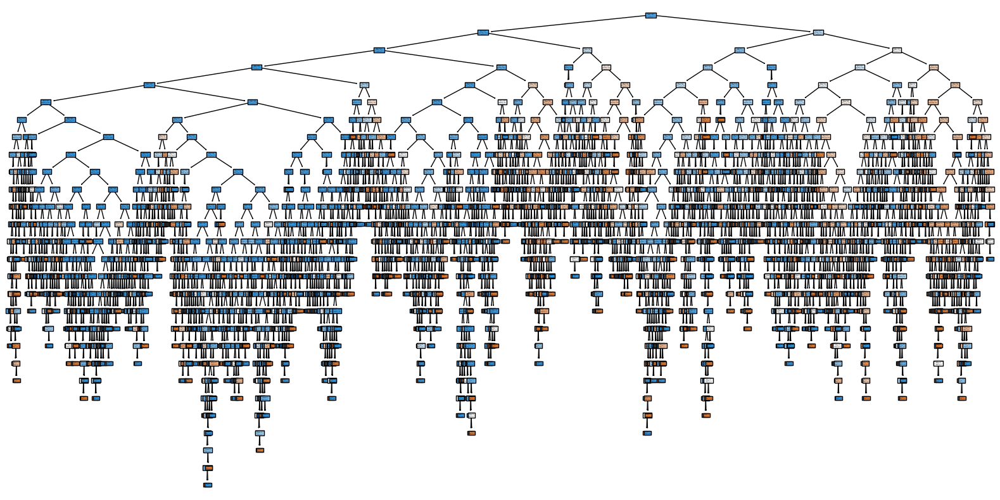

In [91]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

feature_names1 = list(X_encoded.columns)
# Plot the final decision tree
plt.figure(figsize=(20,10))  # Set the figure size
plot_tree(clf_DT, feature_names=feature_names1, class_names=["no", "yes"], filled=True)
plt.show()

## 5-2 Training a tree for each feature:

In [97]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import recall_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
import numpy as np

#Defining features and target variable y
X = dataset[['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome']]
y = dataset['y']
#Labeling encoding for categorical features
label_encoder = LabelEncoder()
X_encoded = X.copy()
for col in ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']:
    X_encoded[col] = label_encoder.fit_transform(X[col])

# Convert target variable y to binary values 0 or 1
y_binary = y.replace({'yes': 1, 'no': 0})

# Perform 5-fold cross-validation for each feature
skf = StratifiedKFold(n_splits=5, shuffle=True)
for feature in X_encoded.columns:
    print(f"\nTraining Decision Tree for feature: {feature}")
    f1_scores = []
    recall_scores = []
    precision_scores = []
    accuracy_scores = []
    for train_index, test_index in skf.split(X_encoded[[feature]], y_binary):
        X_train, X_test = X_encoded[[feature]].iloc[train_index], X_encoded[[feature]].iloc[test_index]
        y_train, y_test = y_binary.iloc[train_index], y_binary.iloc[test_index]
        clf_DT1 = DecisionTreeClassifier()
        clf_DT1.fit(X_train, y_train)
        #Predictions on the test set
        y_pred = clf_DT1.predict(X_test)
        #Calculate recall for each fold for each feature
        recall = recall_score(y_test, y_pred)
        recall_scores.append(recall)
    #Calculate and print the mean recall for the current feature
    mean_recall = np.mean(recall_scores)
    print(f"Mean recall for feature {feature}: {mean_recall}")


Training Decision Tree for feature: age
Mean recall for feature age: 0.022233253540133772

Training Decision Tree for feature: job
Mean recall for feature job: 0.0

Training Decision Tree for feature: marital
Mean recall for feature marital: 0.0

Training Decision Tree for feature: education
Mean recall for feature education: 0.0

Training Decision Tree for feature: default
Mean recall for feature default: 0.0

Training Decision Tree for feature: balance
Mean recall for feature balance: 0.07944939015197479

Training Decision Tree for feature: housing
Mean recall for feature housing: 0.0

Training Decision Tree for feature: loan
Mean recall for feature loan: 0.0

Training Decision Tree for feature: contact
Mean recall for feature contact: 0.0

Training Decision Tree for feature: day
Mean recall for feature day: 0.0

Training Decision Tree for feature: month
Mean recall for feature month: 0.04962033880854412

Training Decision Tree for feature: duration
Mean recall for feature duration:

### In this last part i only calculated the recall for each tree, each feature creates(trains); so that I can see how many correct yes's have been generated in the algorithm. 
After a small research I gathered this information which I coppied from chat GPT to answer this last 
question(تحقیق کنید importance feature درباره):
##### In the context of machine learning, feature importance refers to a technique used to determine the most relevant features in a dataset with respect to the target variable. It helps identify which features have the most significant impact on the prediction outcome.

There are several methods to calculate feature importance, and it depends on the algorithm used. For example:

1. **Decision Trees and Ensembles (Random Forests, Gradient Boosting Machines):** Feature importance is calculated based on how much each feature decreases the impurity in the tree nodes. Features that result in the largest decrease in impurity are considered more important.

2. **Linear Models (Logistic Regression, Linear Regression):** Feature importance is often determined by the magnitude of the coefficients assigned to each feature in the model. Larger coefficient values indicate more importance.

3. **Permutation Importance:** This method involves shuffling the values of each feature and measuring the effect on model performance. The decrease in performance after shuffling indicates the importance of the feature.

4. **L1 Regularization (Lasso Regression):** In Lasso regression, the regularization term encourages sparsity in the coefficients, effectively setting less important features' coefficients to zero.

5. **XGBoost and LightGBM:** These gradient boosting algorithms provide built-in feature importance metrics based on how often each feature is used in the tree ensemble during training.

Understanding feature importance can be valuable for various tasks, such as feature selection, model interpretation, and identifying key factors driving predictions.

# Please add your test file here and replace the name with 'test2.csv' in the code below:
### Please make sure you have ran the decision tree main code so that the trained tree is available. 

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
#Load training dataset
train_df1 = pd.read_csv('dataset.csv')
#remove the last column (as explained above)
train_df = train_df1.iloc[:, :-1]
#remove the Unnamed column
train_df = train_df.drop(columns=['Unnamed: 0'])
########################################################################
# REPLACE YOUR FILE NAME HERE:
test_df = pd.read_csv('test2.csv')
########################################################################
#remove the Unnamed column
test_df = test_df.drop(columns=['Unnamed: 0'])
#merge or combine training and test datasets
combined_df = pd.concat([train_df, test_df], ignore_index=True)
#LabelEncoder:
label_encoder = LabelEncoder()
#Fit LabelEncoder on combined dataset
for col in ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']:
    combined_df[col] = label_encoder.fit_transform(combined_df[col])

#Split combined dataset back into train and test
train_df = combined_df[:len(train_df)]
test_df = combined_df[len(train_df):]
# Predict using the trained SVC model and converting the output labels to yes or no:
y_pred_test1 = clf_DT.predict(test_df)
y_pred_test = 5-y_pred_test1
y_pred_test_labels = ["yes" if label == 5 else "no" for label in y_pred_test]  # Convert numerical labels to "no" and "yes"
#Create a DataFrame with the predicted values
result_df = pd.DataFrame({'predicted_y': y_pred_test_labels})
#Save the DataFrame to a CSV file
result_df.to_csv('test2_result.csv', index=False)